In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [4]:
import sys

In [5]:
sys.path

['C:\\Users\\Vera_Kochetkova\\ComputerVision_course\\Computer_Vision\\notebooks',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\python39.zip',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\DLLs',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3',
 '',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\Pythonwin',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\IPython\\extensions',
 'C:\\Users\\Vera_Kochetkova\\.ipython']

['C:\\Users\\Vera_Kochetkova\\ComputerVision_course\\Computer_Vision\\notebooks',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\python39.zip',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\DLLs',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3',
 '',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\Pythonwin',
 'C:\\Users\\Vera_Kochetkova\\Anaconda3\\lib\\site-packages\\IPython\\extensions',
 'C:\\Users\\Vera_Kochetkova\\.ipython']

In [6]:
sys.path.append('../')

In [7]:
from src.utils import find_homo
from src.pansharp import brovey_transform, intensity_transform

In [8]:
def cv2_load2rgb(path):
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    return img

In [9]:
gray_img = cv2.imread("../image_processing_task1/GRAY.JPG", cv2.IMREAD_UNCHANGED)

In [10]:
gray_img.shape

(741, 1363)

(741, 1363)

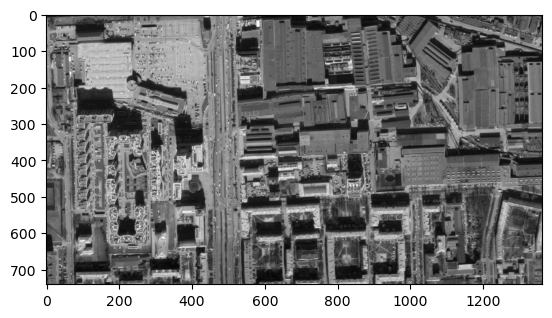

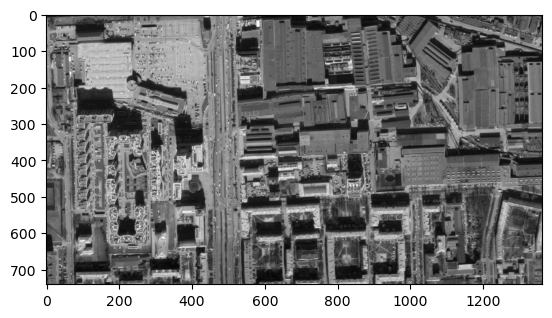

In [11]:
plt.imshow(gray_img, "gray");

In [12]:
rgb_half = cv2_load2rgb("../image_processing_task1/RGB_half.JPG")

In [13]:
rgb_half.shape

(343, 630, 3)

(343, 630, 3)

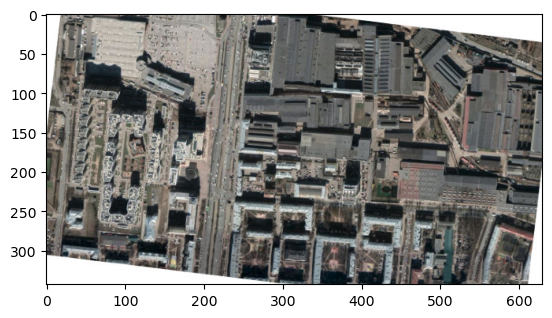

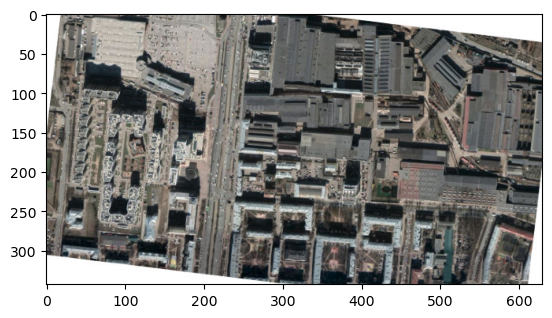

In [14]:
plt.imshow(rgb_half);

In [15]:
rgb_quater = cv2_load2rgb("../image_processing_task1/RGB_quater.JPG")

In [16]:
rgb_quater.shape

(207, 380, 3)

(207, 380, 3)

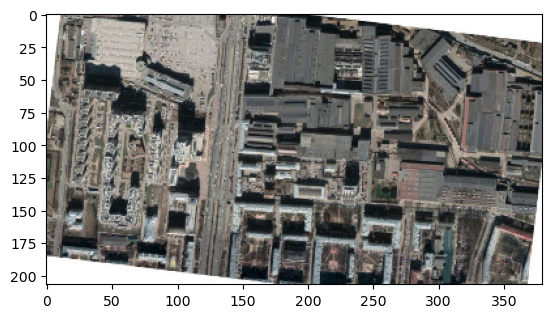

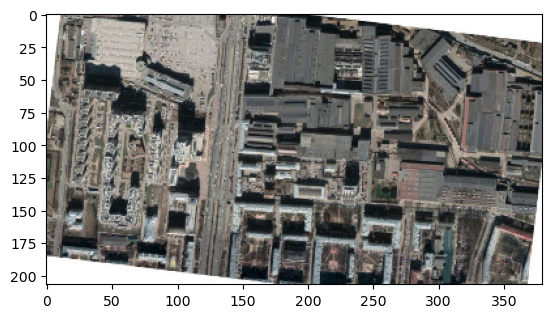

In [17]:
plt.imshow(rgb_quater);

# Pan sharpening

## Feature Matching + Homography to find Objects

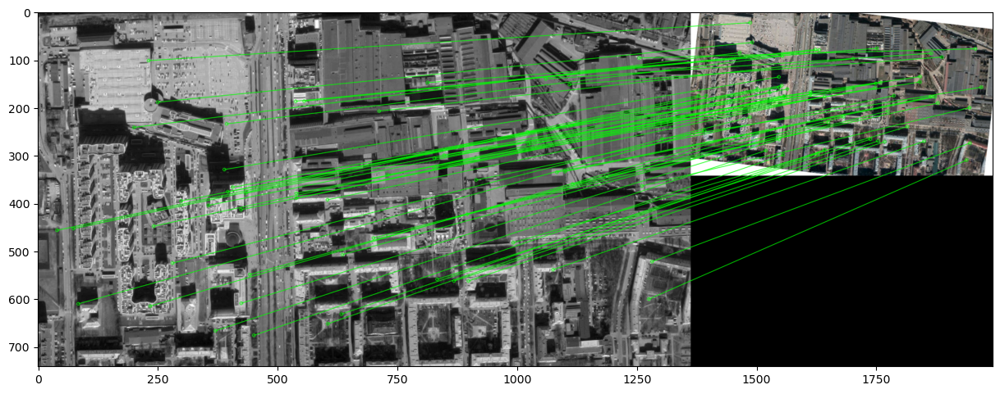

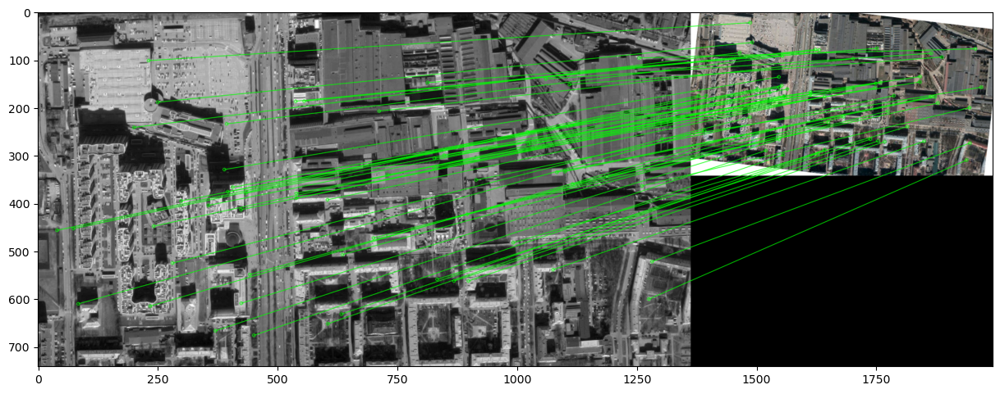

In [18]:
matrix = find_homo(gray_img, rgb_half, limit_dist=0.12, draw_subset=True)

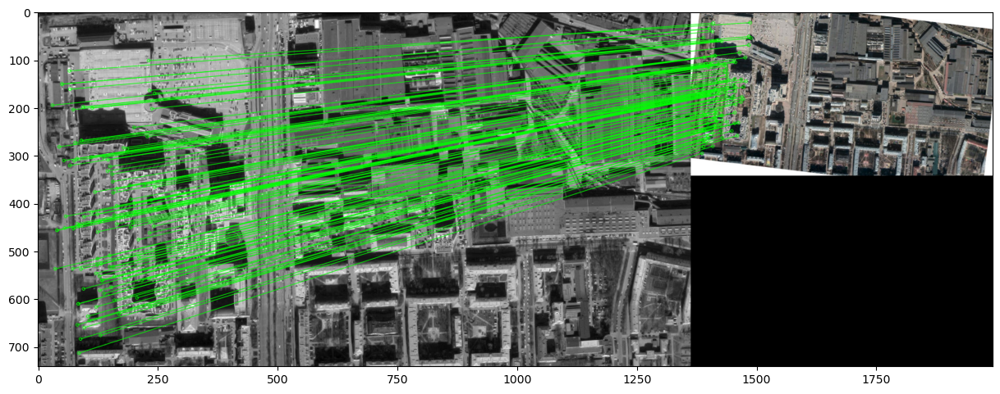

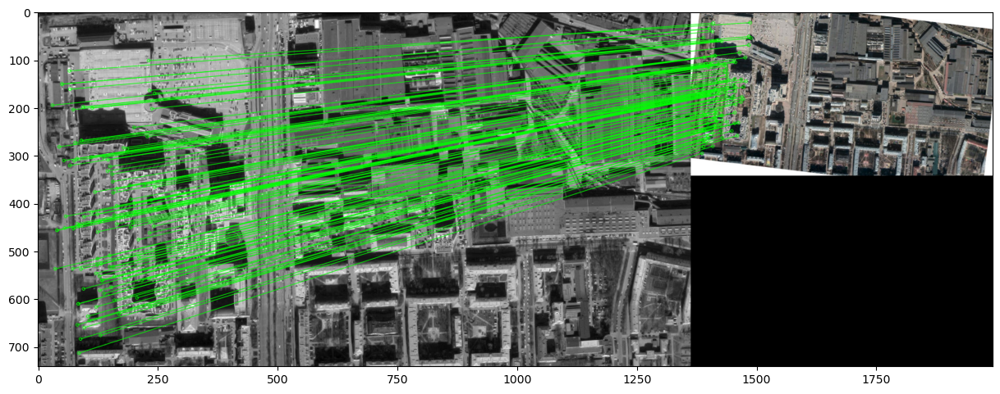

In [19]:
matrix = find_homo(gray_img, rgb_half, limit_dist=0.2, draw_subset=True)

### Transforming

In [20]:
h, w = gray_img.shape

In [21]:
rgb_half.shape[:2]

(343, 630)

(343, 630)

In [22]:
rgb_half_tranf = cv2.warpPerspective(rgb_half, matrix, (w,h), flags=cv2.WARP_INVERSE_MAP)

In [23]:
rgb_half_tranf.shape

(741, 1363, 3)

(741, 1363, 3)

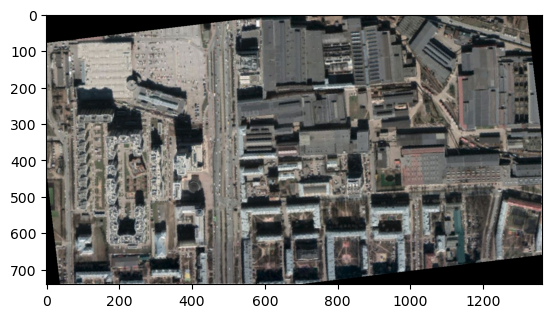

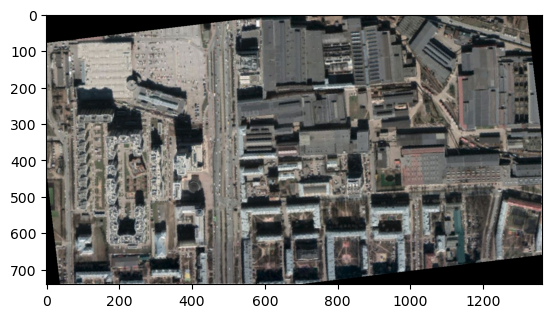

In [24]:
plt.imshow(rgb_half_tranf);

Transformation - success!

## transforming second image

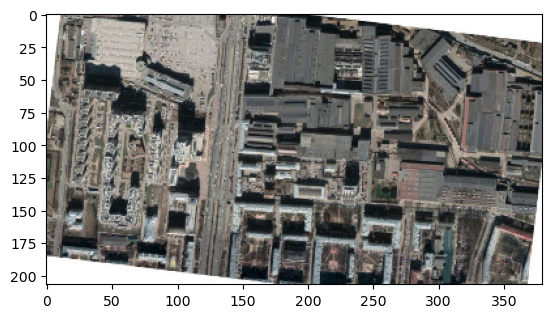

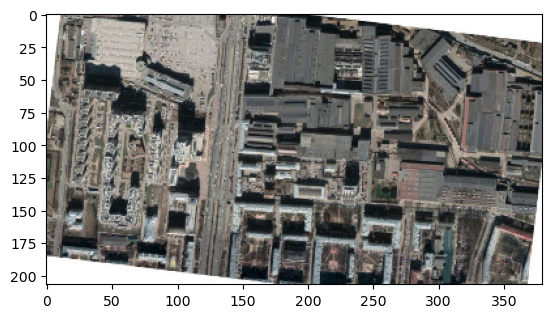

In [25]:
plt.imshow(rgb_quater)

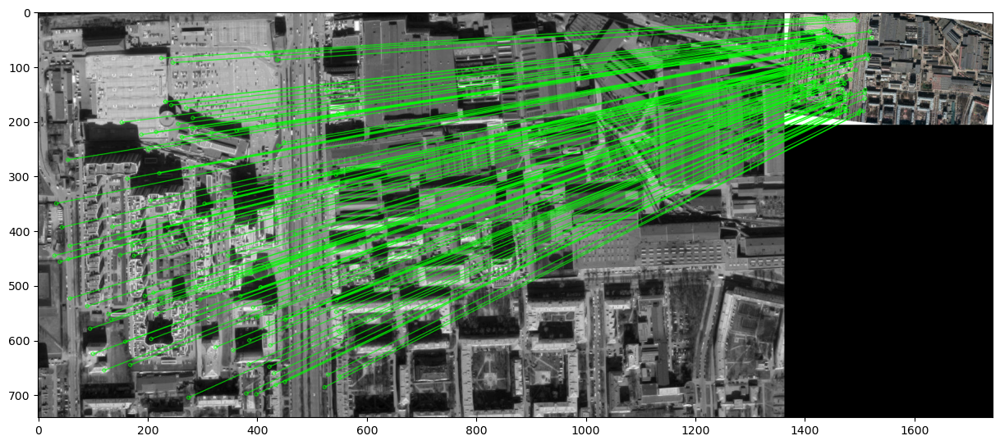

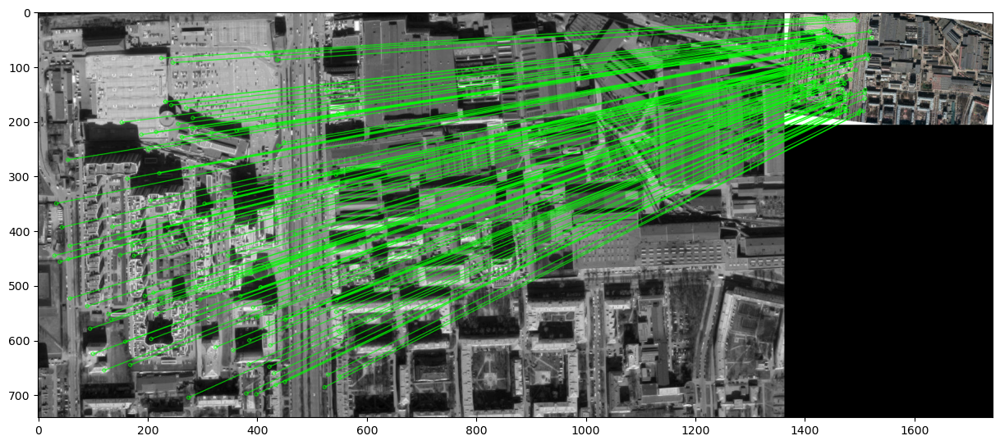

In [26]:
matrix_2 = find_homo(gray_img, rgb_quater, limit_dist=0.3, draw_subset=True)

In [27]:
rgb_quater_tranf = cv2.warpPerspective(rgb_quater, matrix_2, (w,h), flags=cv2.WARP_INVERSE_MAP)

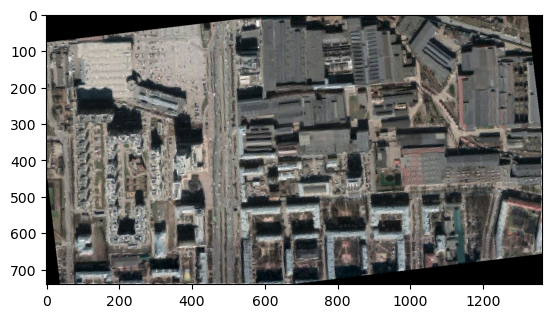

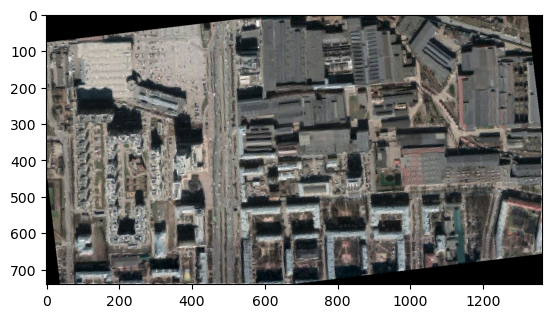

In [28]:
plt.imshow(rgb_quater_tranf);

I have tranformed all colored images using Homography.
Now I need to restore color information 

# Restore color information 

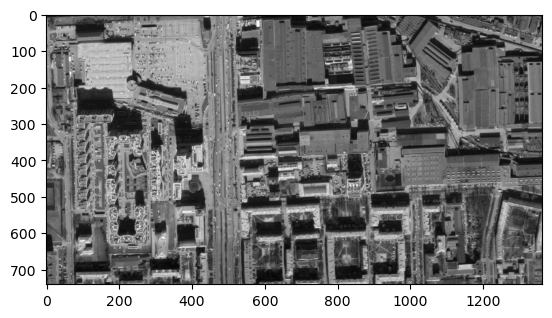

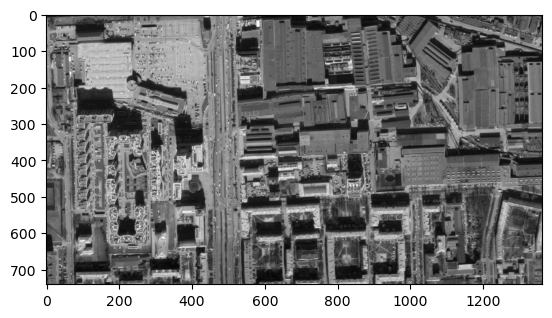

In [29]:
plt.imshow(gray_img, "gray");

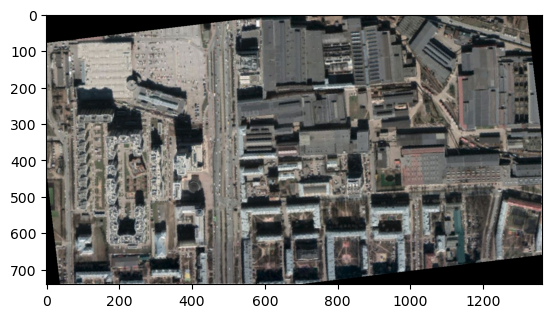

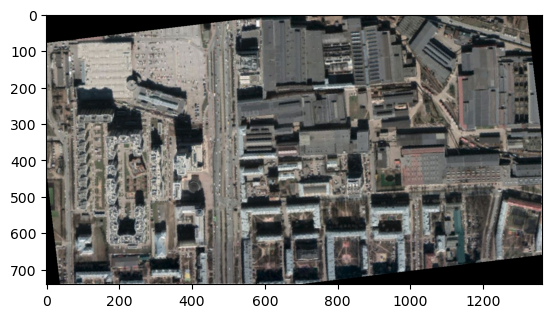

In [30]:
plt.imshow(rgb_half_tranf);

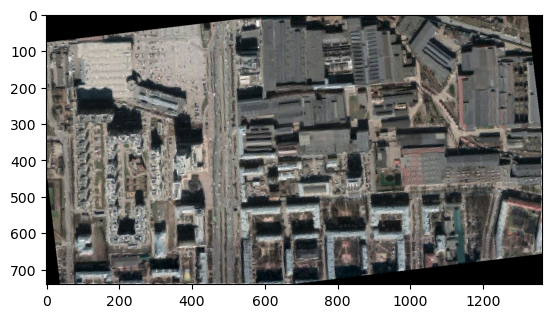

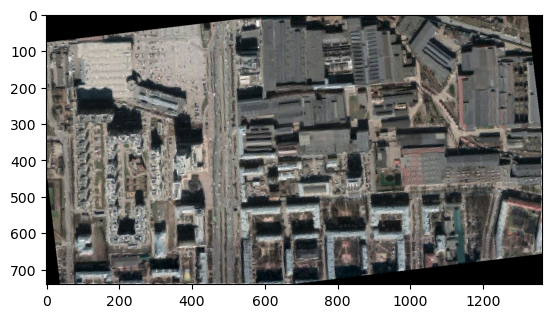

In [31]:
plt.imshow(rgb_quater_tranf);

## HSV using intensity

In [32]:
gray_half = intensity_transform(rgb_half_tranf, gray_img)

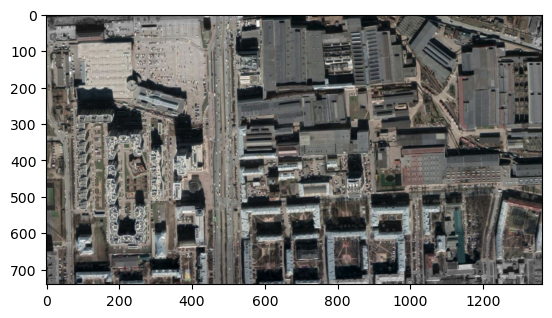

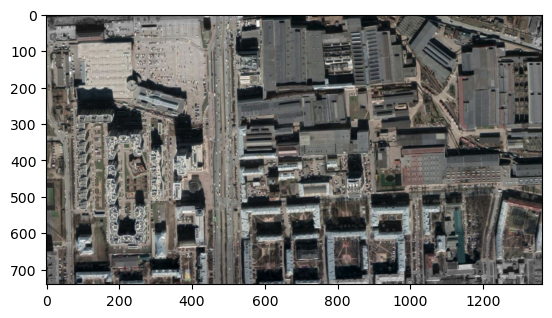

In [33]:
plt.imshow(gray_half)

For comparison - it worked

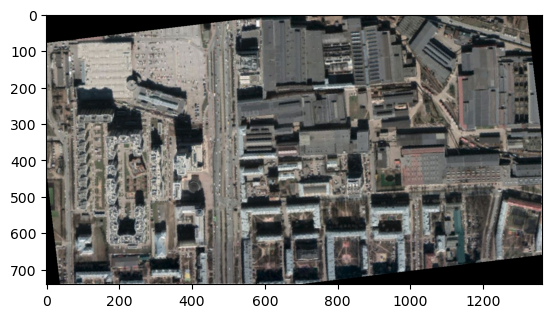

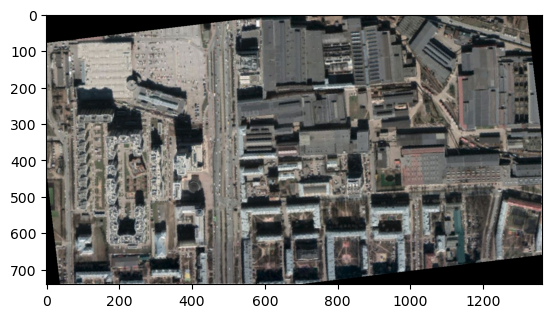

In [34]:
plt.imshow(rgb_half_tranf)

### Let's use second image

In [35]:
gray_quater = intensity_transform(rgb_quater_tranf, gray_img)

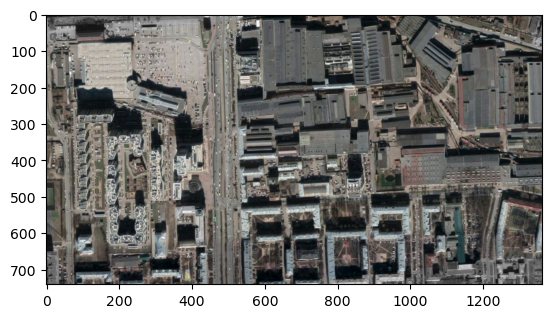

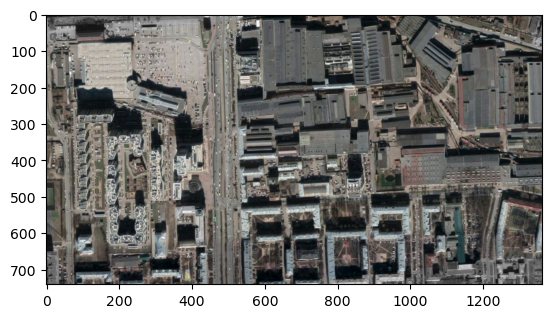

In [36]:
plt.imshow(gray_quater)

It's also worked!

## brovey

In [63]:
from src.utils import find_homo
from src.pansharp import brovey_transform, intensity_transform

$$ Red_{out} = \frac{Pan}{1/3(blue_{in} + green_{in} + red_{in})} *  R_{in} $$

In [64]:
gray_half_brovey = brovey_transform(rgb_half_tranf, gray_img)

uint8
uint8
(741, 1363)
(741, 1363, 3)
[[1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 ...
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]]
94.47944
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
imh
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
275.14795
96.68833
(741, 1363, 3)
uint8
uint8
(741, 1363)
(741, 1363, 3)
[[1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 ...
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-07 1.e-07 ... 1.e-07 1.e-07 1.e-07]
 [1.e-07 1.e-

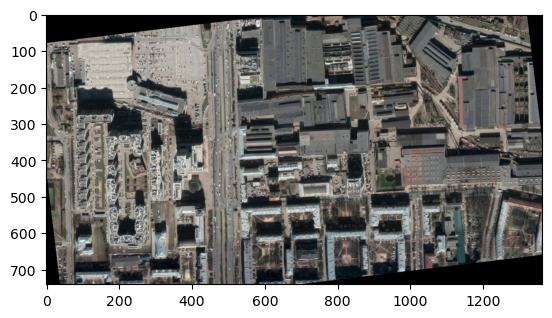

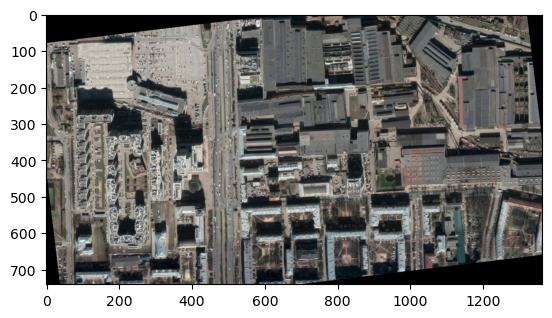

In [65]:
plt.imshow(gray_half_brovey);